<a href="https://colab.research.google.com/github/LYQ7220/Predicting-San-Francisco-House-Price/blob/master/Homework_4_Predict_House_Price.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Ingest

In [0]:
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns; sns.set(color_codes=True)
from sklearn.cluster import KMeans
color = sns.color_palette()
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline

In [0]:
df = pd.read_csv("https://raw.githubusercontent.com/noahgift/real_estate_ml/master/data/Zip_Zhvi_SingleFamilyResidence_2018.csv")


# EDA

In [0]:
df.describe()

,RegionID,RegionName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
count,15508.000,15508.000,15508.000,14338.000,14338.000,14338.000,14338.000,14338.000,14338.000,14338.000,...,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000
mean,80789.618,47683.566,7754.500,115889.866,116007.379,116123.051,116235.493,116358.920,116501.681,116689.315,...,279359.582,280672.685,282148.749,283446.447,284466.282,285500.200,286717.307,288029.320,289187.510,290106.635
std,31521.485,29008.034,4476.918,85115.825,85264.209,85413.118,85566.676,85744.243,85958.867,86230.630,...,361868.364,361360.576,363102.089,365301.815,366277.876,367095.613,366772.521,364624.171,361143.146,359132.687
min,58196.000,1001.000,1.000,11300.000,11500.000,11600.000,11800.000,11800.000,12000.000,12100.000,...,21700.000,21700.000,22100.000,22200.000,22000.000,21800.000,21700.000,21500.000,21600.000,21900.000
25%,67215.000,22199.000,3877.750,66700.000,66800.000,66925.000,67100.000,67200.000,67300.000,67500.000,...,128300.000,128800.000,129675.000,130300.000,131100.000,131900.000,132900.000,134000.000,135100.000,135600.000
50%,77886.500,45792.500,7754.500,96500.000,96700.000,96750.000,96900.000,96900.000,97000.000,97150.000,...,191100.000,192150.000,193400.000,194600.000,195700.000,196900.000,198100.000,199600.000,201100.000,202150.000
75%,90314.250,74010.250,11631.250,140500.000,140600.000,140600.000,140800.000,141000.000,141100.000,141300.000,...,310750.000,312300.000,314325.000,316100.000,317425.000,318325.000,319800.000,321200.000,322425.000,323900.000
max,753844.000,99901.000,15508.000,3676700.000,3704200.000,3729600.000,3754600.000,3781800.000,3813500.000,3849600.000,...,17724700.000,17408900.000,17450500.000,17722800.000,18006700.000,18273800.000,18331900.000,18131900.000,17594900.000,17119600.000


#### Clean Up DataFrame
Rename RegionName to ZipCode and Change Zip Code to String 

In [0]:
df.rename(columns={"RegionName":"ZipCode"}, inplace=True)
df["ZipCode"]=df["ZipCode"].map(lambda x: "{:.0f}".format(x))
df["RegionID"]=df["RegionID"].map(lambda x: "{:.0f}".format(x))


In [0]:
df.head()

,RegionID,ZipCode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
0,84654,60657,Chicago,IL,Chicago-Naperville-Elgin,Cook County,1,334200.000,335400.000,336500.000,...,1037400,1038700,1041500,1042800,1042900,1044400,1047800,1049700,1048300,1047900
1,91982,77494,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,2,210400.000,212200.000,212200.000,...,330400,332700,334500,335900,337000,338300,338400,336900,336000,336500
2,84616,60614,Chicago,IL,Chicago-Naperville-Elgin,Cook County,3,498100.000,500900.000,503100.000,...,1317900,1321100,1325300,1323800,1321200,1320700,1319500,1318800,1319700,1323300
3,93144,79936,El Paso,TX,El Paso,El Paso County,4,77300.000,77300.000,77300.000,...,120800,121300,122200,123000,123600,124500,125600,126300,126800,127400
4,91940,77449,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,5,95400.000,95600.000,95800.000,...,175500,176400,176900,176900,177300,178000,178500,179300,180200,180700


In [0]:
median_prices = df.median()
#sf_prices = df["City"] == "San Francisco".median()


**Median USA Prices December, 2018**

In [0]:
median_prices.tail()

2018-08   196900.000
2018-09   198100.000
2018-10   199600.000
2018-11   201100.000
2018-12   202150.000
dtype: float64

In [0]:
sf_df = df[df["City"] == "San Francisco"].median()
df_comparison = pd.concat([sf_df,median_prices], axis=1)
df_comparison.columns = ["San Francisco","Median USA"]


In [0]:
df_comparison.head()

,San Francisco,Median USA
RegionID,97572.000,77886.500
ZipCode,94118.000,45792.500
SizeRank,1315.000,7754.500
1996-04,306900.000,96500.000
1996-05,307600.000,96700.000


### Visualize

In [0]:
!pip uninstall -q -y plotly
!pip install -q plotly
!pip install -q --upgrade cufflinks

In [0]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [0]:
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import cufflinks as cf
cf.go_offline()
df_comparison.iplot(title="Bay Area Median Single Family Home Prices 1996-2018",
                    xTitle="Year",
                    yTitle="Sales Price",
                   #bestfit=True, bestfit_colors=["pink"],
                   #subplots=True,
                   shape=(5,1),
                    #subplot_titles=True,
                    fill=True,)

In [0]:
df_comparison = df_comparison.reset_index() # change row index to the first column

df_comparison = df_comparison.drop([0,1,2], axis=0) # drop rows that are not dates
df_comparison.columns = ["Date","San Francisco","Median USA"]
df_comparison = df_comparison.reset_index(drop = True) # reset index so that it begins with 0
df_comparison.head()

,Date,San Francisco,Median USA
0,1996-04,306900.000,96500.000
1,1996-05,307600.000,96700.000
2,1996-06,308400.000,96750.000
3,1996-07,309300.000,96900.000
4,1996-08,310500.000,96900.000


#Model

##Modeling - 1Timeseries (ARIMA)

###Make Date as an Index

In [0]:
df_comparison['Date'] = pd.to_datetime(df_comparison['Date'],infer_datetime_format=True) #convert from string to datetime
indexedDataset = df_comparison.set_index(['Date'])
indexedDataset.head(5)

,San Francisco,Median USA
Date,,
1996-04-01,306900.000,96500.000
1996-05-01,307600.000,96700.000
1996-06-01,308400.000,96750.000
1996-07-01,309300.000,96900.000
1996-08-01,310500.000,96900.000


###Split Data

In [0]:
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split

In [0]:
len(indexedDataset)

273

In [0]:
train = indexedDataset.iloc[0:225]
test = indexedDataset.iloc[225:273]
train=pd.DataFrame(train)
test=pd.DataFrame(test);train.tail()

,San Francisco,Median USA
Date,,
2014-08-01,1267300.000,156500.000
2014-09-01,1273700.000,156800.000
2014-10-01,1283900.000,157200.000
2014-11-01,1298100.000,157600.000
2014-12-01,1305500.000,158100.000


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA

###Stationarity Test

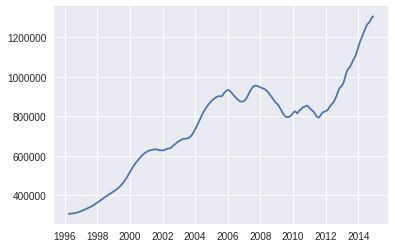

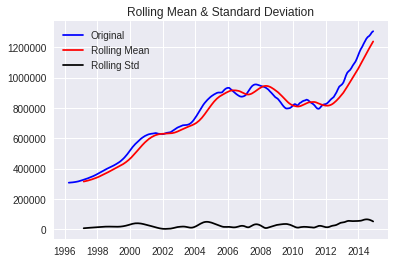

Results of Dickey Fuller Test:
Test Statistic                 -0.553
p-value                         0.881
#Lags Used                      6.000
Number of Observations Used   218.000
Critical Value (1%)            -3.461
Critical Value (5%)            -2.875
Critical Value (10%)           -2.574
dtype: float64


In [0]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=12).mean()
    movingSTD = timeseries.rolling(window=12).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    std = plt.plot(movingSTD, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)


ts = train['San Francisco']    
plt.plot(ts)
plt.show()
test_stationarity(ts)
plt.show()

 For our time series to be stationary, we need to ensure that both the rolling statistics ie: mean & std. dev. remain time invariant or constant with time. Thus the curves for both of them have to be parallel to the x-axis. From the above graph, we see that rolling standard deviation is fairly constant with time and rolling mean itself has some kind of trend component.

For a Time series to be stationary, its ADCF test should have:

p-value to be low (according to the null hypothesis)
The critical values at 1%,5%,10% confidence intervals should be as close as possible to the Test Statistics
From the above ADCF test result, we see that p-value(at max can be 1.0) is very large. Also critical values are no where close to the Test Statistics. Hence, we can safely say that our Time Series at the moment is not stationary

###Data Transformation to achieve Stationarity

There are a couple of ways to achieve stationarity through data transformation like taking  log10 , loge , square, square root, cube, cube root, exponential decay, time shift and so on ...

In our notebook, lets start of with log transformations. Our objective is to remove the trend component. Hence, flatter curves( ie: paralle to x-axis) for time series and rolling mean after taking log would say that our data transformation did a good job.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()



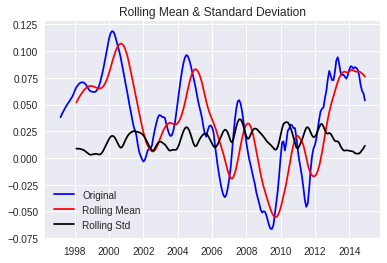

Results of Dickey Fuller Test:
Test Statistic                 -2.444
p-value                         0.130
#Lags Used                      6.000
Number of Observations Used   207.000
Critical Value (1%)            -3.462
Critical Value (5%)            -2.876
Critical Value (10%)           -2.574
dtype: float64


In [0]:
# estimating
ts_log = np.log(ts)
# plt.plot(ts_log)
# plt.show()
moving_avg = pd.rolling_mean(ts_log, 12)
# plt.plot(moving_avg)
# plt.plot(moving_avg,color='red')
# plt.show()
ts_log_moving_avg_diff = ts_log - moving_avg
# print ts_log_moving_avg_diff.head(12)
ts_log_moving_avg_diff.dropna(inplace=True)
test_stationarity(ts_log_moving_avg_diff)
plt.show()


p-value has reduced from 0.894 to 0.236, which suggests we are heading to the right direction

But we still want our hypothesis to be true at a less significance level.

###Time Shift Transformation 

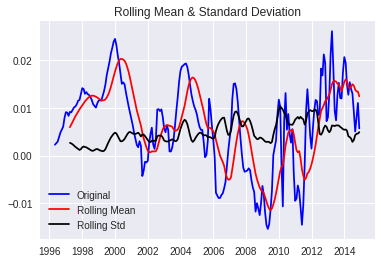

Results of Dickey Fuller Test:
Test Statistic                 -3.454
p-value                         0.009
#Lags Used                      5.000
Number of Observations Used   218.000
Critical Value (1%)            -3.461
Critical Value (5%)            -2.875
Critical Value (10%)           -2.574
dtype: float64


In [0]:
# differencing
ts_log_diff = ts_log.diff(1)
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)
plt.show()

p-value is 0.023, which is less than 0.05. Therefore, the stationary requirement is satisfied at 5% significance level.

/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning:


Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



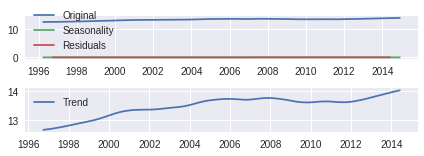

In [0]:
decomposition = seasonal_decompose(ts_log) 

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(ts_log, label='Original')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')

plt.subplot(411)
plt.plot(seasonal, label='Seasonality')
plt.legend(loc='best')

plt.subplot(411)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')

plt.tight_layout()



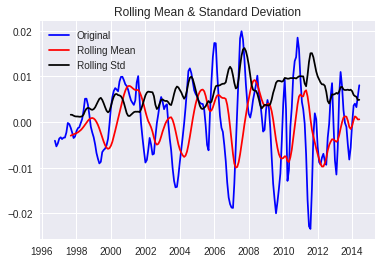

Results of Dickey Fuller Test:
Test Statistic                 -5.124
p-value                         0.000
#Lags Used                      8.000
Number of Observations Used   204.000
Critical Value (1%)            -3.463
Critical Value (5%)            -2.876
Critical Value (10%)           -2.574
dtype: float64


In [0]:
#there can be cases where an observation simply consisted of trend & seasonality. In that case, there won't be 
#any residual component & that would be a null or NaN. Hence, we also remove such cases.
decomposedLogData = residual
decomposedLogData.dropna(inplace=True)
test_stationarity(decomposedLogData)

###Plotting ACF & PACF 

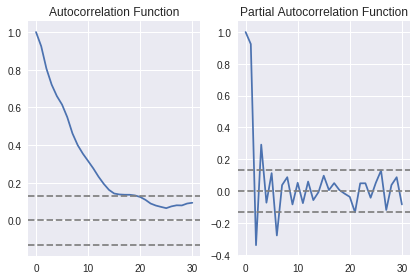

In [0]:
#ACF & PACF plots

lag_acf = acf(ts_log_diff, nlags=30)
lag_pacf = pacf(ts_log_diff, nlags=30, method='ols')

#Plot ACF:
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray')
plt.title('Autocorrelation Function')            

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray') # 5%：1.96 ； 10%：1.65 ； 1%： 2.76
plt.axhline(y=1.96/np.sqrt(len(ts_log_diff)), linestyle='--', color='gray')
plt.title('Partial Autocorrelation Function')
            
plt.tight_layout()   

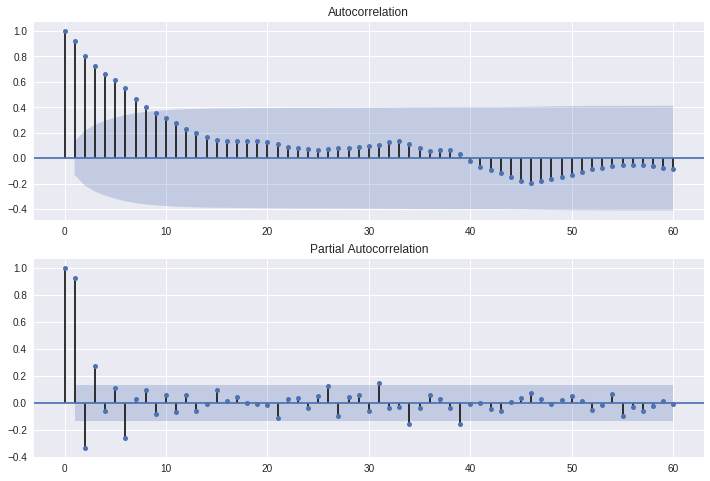

In [0]:
plt.figure(figsize=(12, 8))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(ts_log_diff.values.squeeze(), 
                         lags=60, ax=ax)
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(ts_log_diff.values.squeeze(), 
                          lags=60, ax=ax);

###Building Models

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:646: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:650: FutureWarning:

Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:577: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



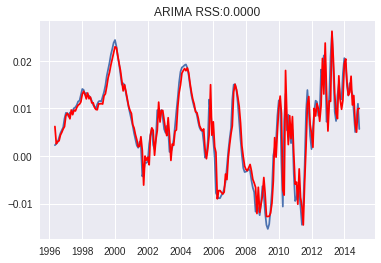

In [0]:
#Mutiply ts_log and ts_log_diff by 10 so that the RSS won't be too close to 0, in which case we can not tell which model is better
model = ARIMA(ts_log, order=(1, 1, 10))
result_ARIMA = model.fit(disp=-1)
plt.plot(ts_log_diff)
plt.plot(result_ARIMA.fittedvalues, color='red')
plt.title('ARIMA RSS:%.4f' % sum(result_ARIMA.fittedvalues - ts_log_diff) ** 2)
plt.show()


In [0]:
#print(result_ARIMA.summary())

###Prediction & Reverse transformations

In [0]:
ts_tes_log = np.log(test['San Francisco'])
ts_tes_log_diff = ts_tes_log.diff(1)


In [0]:
#predictions = result_ARIMA.forecast(len(ts_tes_log));predictions
predictions = pd.DataFrame(result_ARIMA.predict(start = list(ts_tes_log.index)[0], end = list(ts_tes_log.index)[-1]))
predictions = predictions.rename(columns = {0 : "Price_log_diff"}) ;predictions.head()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:577: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



,Price_log_diff
2015-01-01,0.004
2015-02-01,0.003
2015-03-01,0.003
2015-04-01,0.006
2015-05-01,0.005


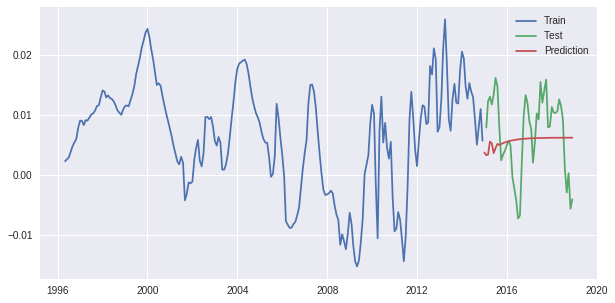

In [0]:
plt.figure(figsize=(10,5))
plt.plot(ts_log_diff, label='Train')
plt.plot(ts_tes_log_diff, label='Test')
plt.plot(predictions, label='Prediction')
plt.legend(loc='best')
plt.show()

In [0]:
predictions_ARIMA_diff = pd.Series(predictions["Price_log_diff"], copy=True)
print(predictions_ARIMA_diff.head())

2015-01-01   0.004
2015-02-01   0.003
2015-03-01   0.003
2015-04-01   0.006
2015-05-01   0.005
Freq: MS, Name: Price_log_diff, dtype: float64


In [0]:
#Convert to cumulative sum
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
print(predictions_ARIMA_diff_cumsum)

2015-01-01   0.004
2015-02-01   0.007
2015-03-01   0.010
2015-04-01   0.016
2015-05-01   0.021
2015-06-01   0.025
2015-07-01   0.029
2015-08-01   0.034
2015-09-01   0.039
2015-10-01   0.045
2015-11-01   0.050
2015-12-01   0.055
2016-01-01   0.061
2016-02-01   0.066
2016-03-01   0.072
2016-04-01   0.078
2016-05-01   0.084
2016-06-01   0.090
2016-07-01   0.096
2016-08-01   0.101
2016-09-01   0.107
2016-10-01   0.113
2016-11-01   0.120
2016-12-01   0.126
2017-01-01   0.132
2017-02-01   0.138
2017-03-01   0.144
2017-04-01   0.150
2017-05-01   0.156
2017-06-01   0.162
2017-07-01   0.168
2017-08-01   0.175
2017-09-01   0.181
2017-10-01   0.187
2017-11-01   0.193
2017-12-01   0.199
2018-01-01   0.206
2018-02-01   0.212
2018-03-01   0.218
2018-04-01   0.224
2018-05-01   0.230
2018-06-01   0.237
2018-07-01   0.243
2018-08-01   0.249
2018-09-01   0.255
2018-10-01   0.261
2018-11-01   0.268
2018-12-01   0.274
Freq: MS, Name: Price_log_diff, dtype: float64


In [0]:
predictions_ARIMA_log = pd.Series(ts_tes_log.iloc[0], index=ts_tes_log.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
predictions_ARIMA_log.head()

Date
2015-01-01   14.090
2015-02-01   14.093
2015-03-01   14.096
2015-04-01   14.102
2015-05-01   14.107
dtype: float64

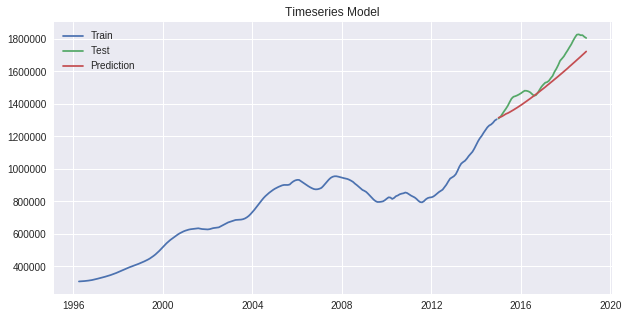

In [0]:
# Inverse of log is exp.
predictions_ARIMA = np.exp(predictions_ARIMA_log)

plt.figure(figsize=(10,5))
plt.plot(train['San Francisco'], label='Train')
plt.plot(test['San Francisco'], label='Test')
plt.plot(predictions_ARIMA, label='Prediction')
plt.title('Timeseries Model')
plt.legend(loc='best')
plt.show()

#plt.plot(test['San Francisco'],label='Actual Price')
#plt.plot(predictions_ARIMA, label='Predicted Price')

###Accuracy

Text(0.5, 1.0, 'Timeseries Model')

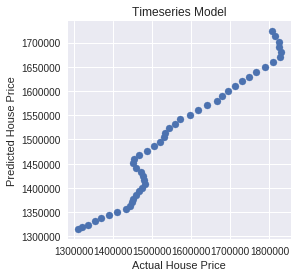

In [0]:
from matplotlib import pyplot as plt
plt.figure(figsize=(4,4))
plt.scatter(test['San Francisco'], predictions_ARIMA)
plt.xlabel("Actual House Price")
plt.ylabel("Predicted House Price")
plt.title('Timeseries Model')

In [0]:
from sklearn import metrics
r = metrics.r2_score(test['San Francisco'], predictions_ARIMA)
r

0.7502511823295722

##Modeling - 2 Machine Learning

###Prepare Data and Select Features

In [0]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split


In [0]:
ca_df = df[df["State"] == "CA"].median()
la_df = df[df["City"] == "Los Angeles"].median()
oak_df = df[df["City"] == "Oakland"].median()
sj_df = df[df["City"] == "San Jose"].median()
sa_df = df[df["City"] == "Sacramento"].median()
sc_df = df[df["City"] == "Santa Clara"].median()
lb_df = df[df["City"] == "Long Beach"].median()
al_df = df[df["City"] == "Alhambra"].median()


In [0]:
df_comparison = pd.concat([ca_df,la_df,oak_df,sj_df,sa_df,sc_df, lb_df, al_df, sf_df,median_prices], axis=1)


df_comparison = df_comparison.reset_index() # change row index to the first column

df_comparison = df_comparison.drop([0,1,2], axis=0) # drop rows that are not dates
df_comparison.columns = ["Date","CA","LA","OAK","SJ","SA","SC","LB","AL","San Francisco","Median USA"]
df_comparison = df_comparison.reset_index(drop = True) # reset index so that it begins with 0

df_comparison.head()

,Date,CA,LA,OAK,SJ,SA,SC,LB,AL,San Francisco,Median USA
0,1996-04,163200.000,165300.000,160800.000,234600.000,109450.000,238550.000,171700.000,173100.000,306900.000,96500.000
1,1996-05,162700.000,165300.000,161000.000,235100.000,109150.000,239750.000,171500.000,172800.000,307600.000,96700.000
2,1996-06,162350.000,165200.000,161300.000,235900.000,108750.000,241100.000,171300.000,172500.000,308400.000,96750.000
3,1996-07,162150.000,164650.000,161600.000,237300.000,108400.000,242450.000,171000.000,172100.000,309300.000,96900.000
4,1996-08,162200.000,164550.000,161900.000,238800.000,108100.000,243850.000,170800.000,171700.000,310500.000,96900.000


In [0]:
df_sf = df_comparison.reset_index()

In [0]:
df_sf['index']=df_sf['index']*1000
df_sf.rename(columns={"index":"Date_num"}, inplace=True)
df_sf.head()

,Date_num,Date,CA,LA,OAK,SJ,SA,SC,LB,AL,San Francisco,Median USA
0,0,1996-04,163200.000,165300.000,160800.000,234600.000,109450.000,238550.000,171700.000,173100.000,306900.000,96500.000
1,1000,1996-05,162700.000,165300.000,161000.000,235100.000,109150.000,239750.000,171500.000,172800.000,307600.000,96700.000
2,2000,1996-06,162350.000,165200.000,161300.000,235900.000,108750.000,241100.000,171300.000,172500.000,308400.000,96750.000
3,3000,1996-07,162150.000,164650.000,161600.000,237300.000,108400.000,242450.000,171000.000,172100.000,309300.000,96900.000
4,4000,1996-08,162200.000,164550.000,161900.000,238800.000,108100.000,243850.000,170800.000,171700.000,310500.000,96900.000


In [0]:
df_sf['Date'] = pd.to_datetime(df_sf['Date'],infer_datetime_format=True) #convert from string to datetime
indexeddf_sf = df_sf.set_index(['Date'])
indexeddf_sf.head(5)

,Date_num,CA,LA,OAK,SJ,SA,SC,LB,AL,San Francisco,Median USA
Date,,,,,,,,,,,
1996-04-01,0,163200.000,165300.000,160800.000,234600.000,109450.000,238550.000,171700.000,173100.000,306900.000,96500.000
1996-05-01,1000,162700.000,165300.000,161000.000,235100.000,109150.000,239750.000,171500.000,172800.000,307600.000,96700.000
1996-06-01,2000,162350.000,165200.000,161300.000,235900.000,108750.000,241100.000,171300.000,172500.000,308400.000,96750.000
1996-07-01,3000,162150.000,164650.000,161600.000,237300.000,108400.000,242450.000,171000.000,172100.000,309300.000,96900.000
1996-08-01,4000,162200.000,164550.000,161900.000,238800.000,108100.000,243850.000,170800.000,171700.000,310500.000,96900.000


###Correlation Heatmap

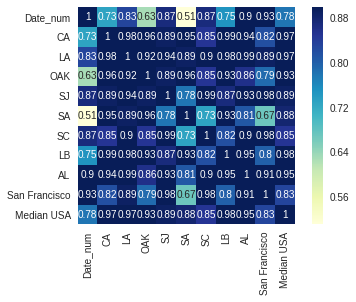

In [0]:
import seaborn as sns
sns.heatmap(round(df_sf.corr(),2), vmax=.9, square=True,
            annot = True,
            #cmap="RdBu" #Red>Blue
            cmap="YlGnBu" #Blue
            #xticklabels=df.columns.values, yticklabels=df.columns.values
           )

###Split Data

In [0]:
y = df_sf['San Francisco'].values #Target
y = y.reshape(-1, 1)
#X = df_sf[['Date_num', 'Median USA']].values #Feature(s)
#X = X.reshape(-1, 2)
X = df_sf[['Date_num',"CA","LA","OAK","SJ","SA","SC","LB","AL",'Median USA']].values #Feature(s)
X = X.reshape(-1, 10)


In [0]:
y = indexeddf_sf['San Francisco'] #Target
#X = df_sf[['Date_num', 'Median USA']].values #Feature(s)
#X = X.reshape(-1, 2)
X = indexeddf_sf[['Date_num',"CA","LA","OAK","SJ","SA","SC","LB","AL",'Median USA']] #Feature(s)

In [0]:
y.head()

Date
1996-04-01   306900.000
1996-05-01   307600.000
1996-06-01   308400.000
1996-07-01   309300.000
1996-08-01   310500.000
Name: San Francisco, dtype: float64

In [0]:
X_train = X[:len(X)-48]
X_test = X[len(X)-48:]
y_train = y[:len(X)-48]
y_test = y[len(X)-48:]
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(225, 10) (225,)
(48, 10) (48,)


In [0]:
y_train.head()

Date
1996-04-01   306900.000
1996-05-01   307600.000
1996-06-01   308400.000
1996-07-01   309300.000
1996-08-01   310500.000
Name: San Francisco, dtype: float64

In [0]:
#X_train = X[: 273-12*2, :]
#X_test = X[261:, :] 
#y_train = y[:261, :] 
#y_test = y[261:, :]
#print(X_train.shape, y_train.shape)
#print(X_test.shape, y_test.shape)

###Bulid Model and Prediction

In [0]:
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)
#results = lm.predict(X_test)
results = pd.DataFrame(model.predict(X_test), index = X_test.index);results.head()

,0
Date,
2015-01-01,1252275.196
2015-02-01,1271795.827
2015-03-01,1293001.653
2015-04-01,1316075.238
2015-05-01,1355045.369


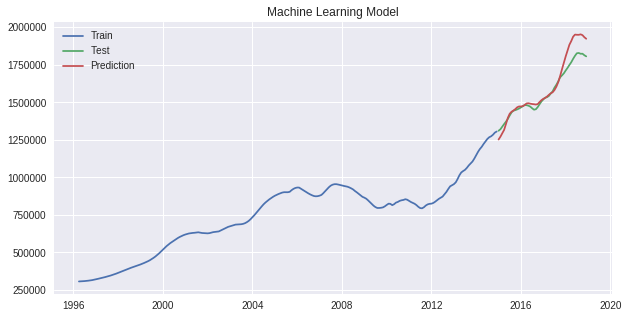

In [0]:
plt.figure(figsize=(10,5))
plt.plot(y_train, label='Train')
plt.plot(y_test, label='Test')
plt.plot(results, label='Prediction')
plt.title('Machine Learning Model')
plt.legend(loc='best')
plt.show()

###Accuracy

Text(0.5, 1.0, 'Machine Learning Model')

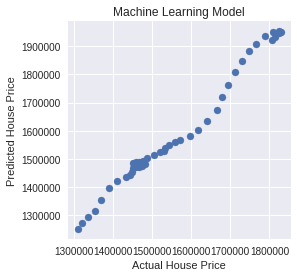

In [0]:
plt.figure(figsize=(4,4))
plt.scatter(y_test, results)
plt.xlabel("Actual House Price")
plt.ylabel("Predicted House Price")
plt.title('Machine Learning Model')

In [0]:
from sklearn import metrics
r = metrics.r2_score(y_test, results)
r

0.8161040677518793

In [0]:
model.score(X_test, y_test)

0.8161040677518793

In [0]:
#Adjusted - R2
1-((1-r)*(48-1))/(48-10-1)

0.7664024644415763

# Conclusion


*   Accuracy for both and the corresponding values of the ARIMA model and the linear regression model are 0.75 and 0.77 respectively.
*   In this case,  linear regression outperforms machine learning model slightly.



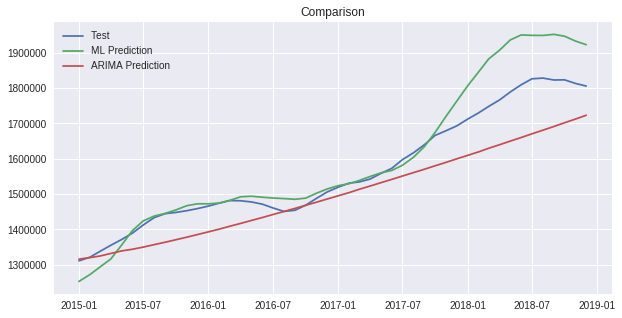

In [0]:
plt.figure(figsize=(10,5))
plt.plot(y_test, label='Test')
plt.plot(results, label='ML Prediction')
plt.plot(predictions_ARIMA, label='ARIMA Prediction')
plt.title('Comparison')
plt.legend(loc='best')
plt.show()


#Reference

Timeseries-ARIMA: 

*   https://blog.csdn.net/shine19930820/article/details/72667656;
*   https://www.kaggle.com/thebrownviking20/everything-you-can-do-with-a-time-series;
*   https://www.kaggle.com/freespirit08/time-series-for-beginners-with-arima



Index<->Column df.reset_index()
*   https://blog.csdn.net/weixin_38168620/article/details/80100014
